In [1]:
%load_ext autoreload
# to make modification in .py file type %autoreload

%load_ext line_profiler
#for finding out how long code takes to run
#an example of how to get diagnostics on functions
#%lprun -f ff.generate_map_full ff.generate_map_full(384, A_BB, alpha_BB, beta_sigma, freqs, nu0)

In [2]:
#trying to consolidate the work so far into a cohesive document and notation. Pushing definitions into 
#separate .py file

#------packages-------------------
%pylab inline
import time
import healpy as hp
import matplotlib.pyplot as plt
import foreground_functions as ff
from scipy.optimize import curve_fit, minimize

Populating the interactive namespace from numpy and matplotlib


# parameters for generating map

In [139]:
params_s = [1.7e3, -3.0, -3.2, -2.5]
A_s, alpha_s, beta_s, gamma_s = synch_params
params_d = [4.5e3, -2.0, -1.5, -3.5]
A_d, alpha_d, beta_d, gamma_d = dust_params

params = params_s + params_d

nside=128
ells = np.arange(384)
freqs = np.linspace(30, 300, 10)*1.e9

In [104]:
synch_amp_map = ff.map_amp(ells, [A_s, alpha_s])
dust_amp_map = ff.map_amp(ells, [A_d, alpha_d])

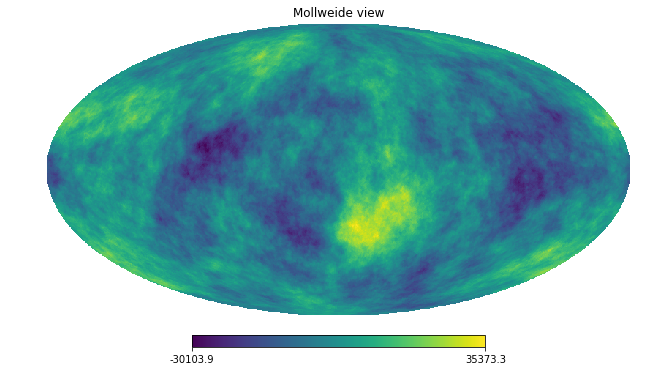

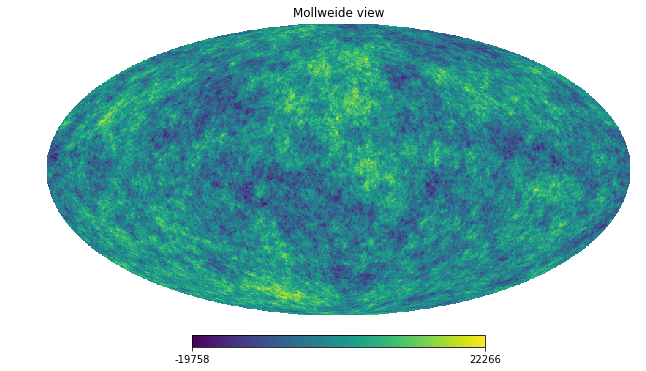

In [105]:
hp.mollview(synch_amp_map)
hp.mollview(dust_amp_map)

In [106]:
synch_pcls = hp.anafast(synch_amp_map)
dust_pcls = hp.anafast(dust_amp_map)

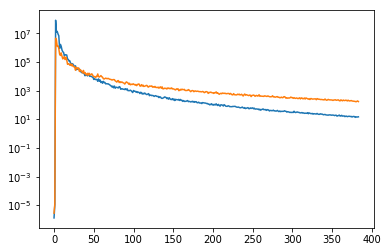

In [107]:
semilogy(synch_pcls)
semilogy(dust_pcls)

In [108]:
synch_beta_map = ff.map_beta(ells, [beta_s, gamma_s])
dust_beta_map = ff.map_beta(ells, [beta_d, gamma_d])

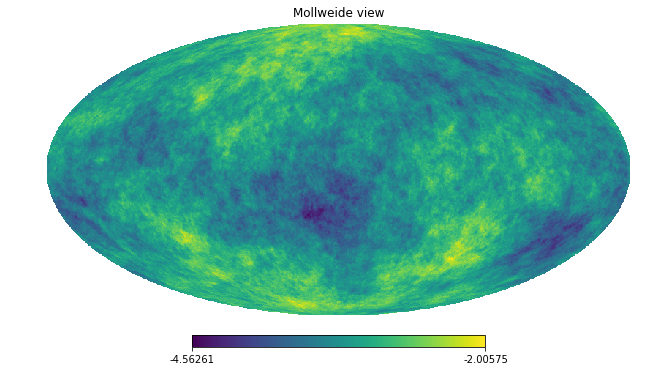

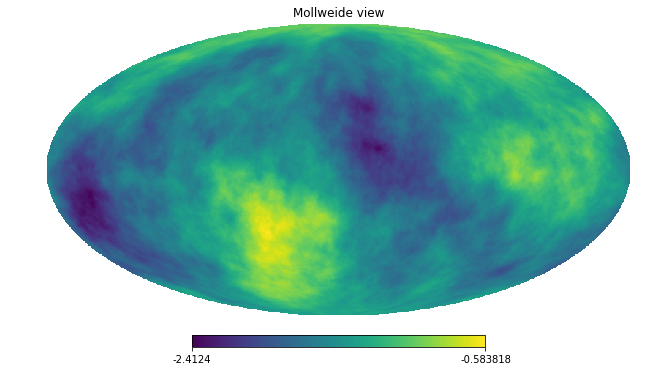

In [109]:
hp.mollview(synch_beta_map)
hp.mollview(dust_beta_map)

In [110]:
synch_bcls = hp.anafast(synch_beta_map)
dust_bcls = hp.anafast(dust_beta_map)

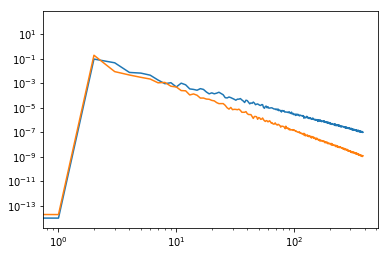

In [111]:
loglog(synch_bcls)
loglog(dust_bcls)

In [112]:
full_synch = ff.map_synch(ells, freqs, params_s)

In [125]:
%autoreload
full_dust = ff.map_dust(ells, freqs, params_d)

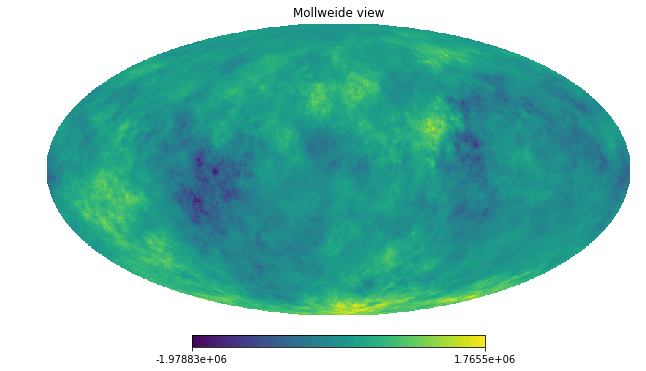

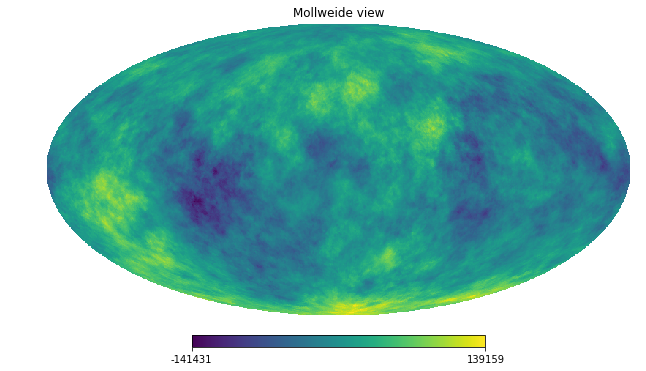

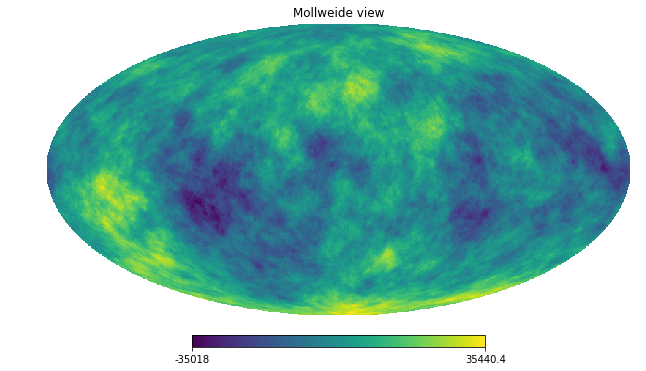

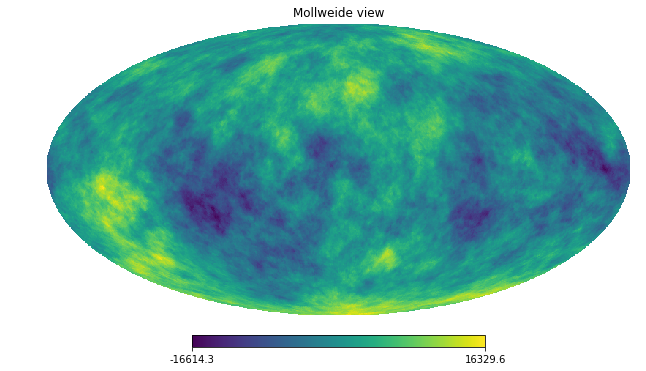

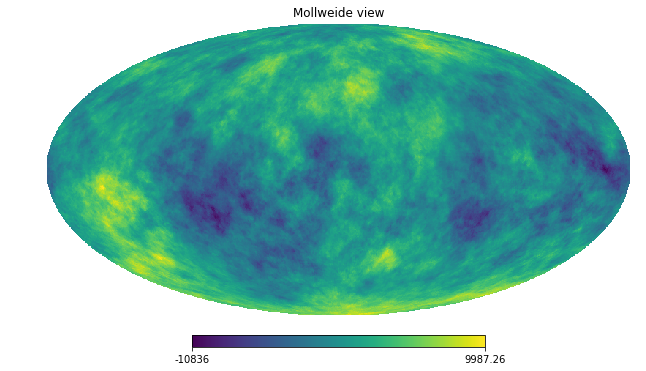

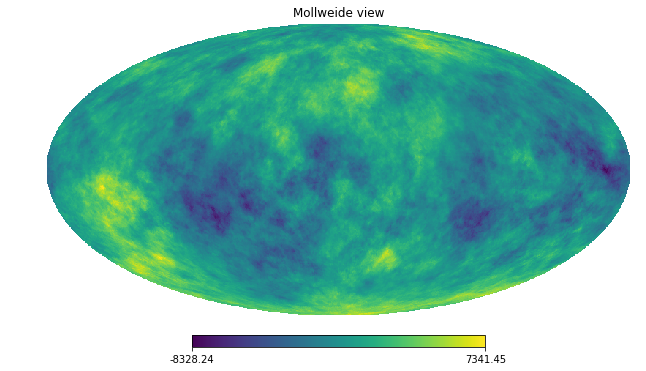

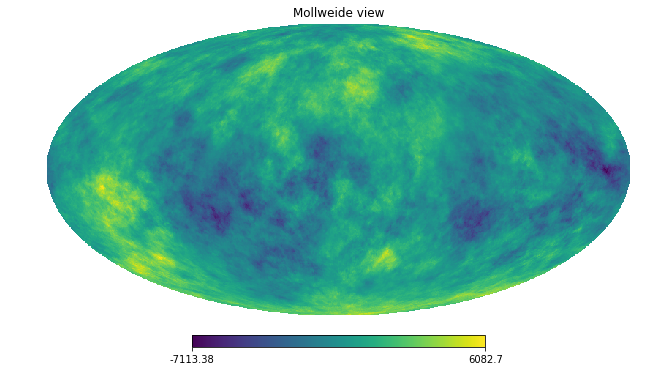

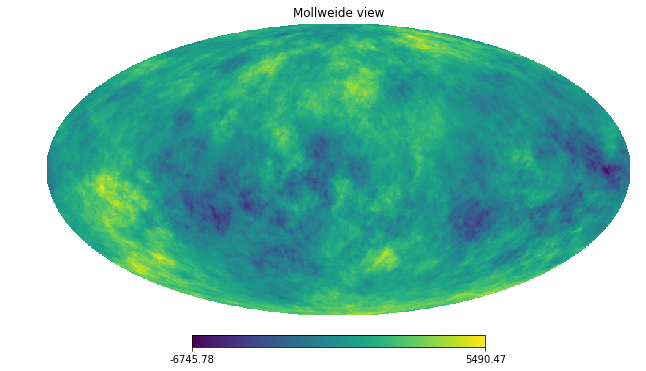

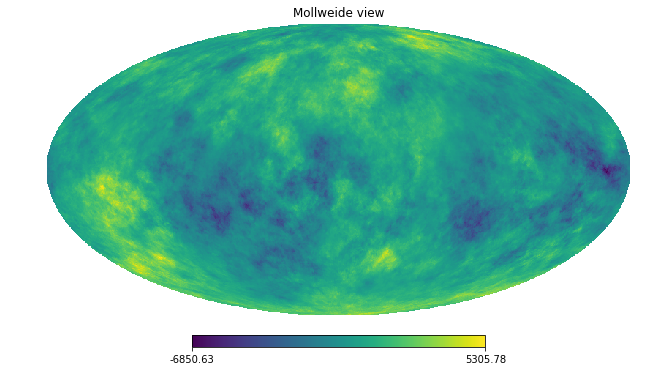

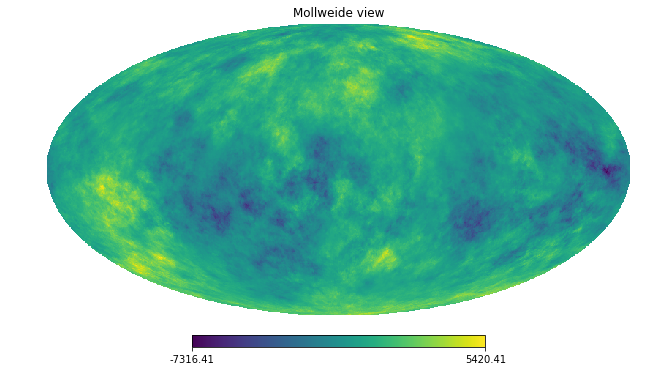

In [114]:
for i in range(len(freqs)):
    hp.mollview(full_synch[i])

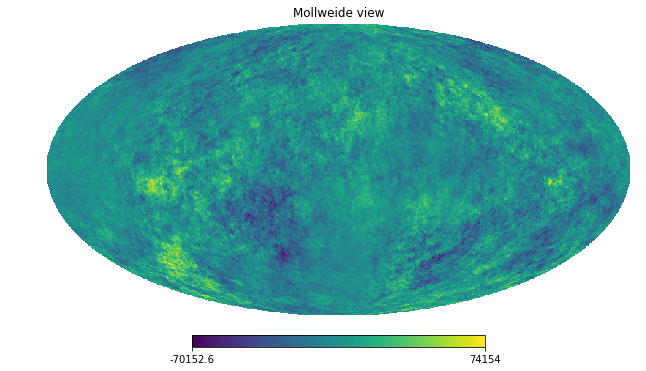

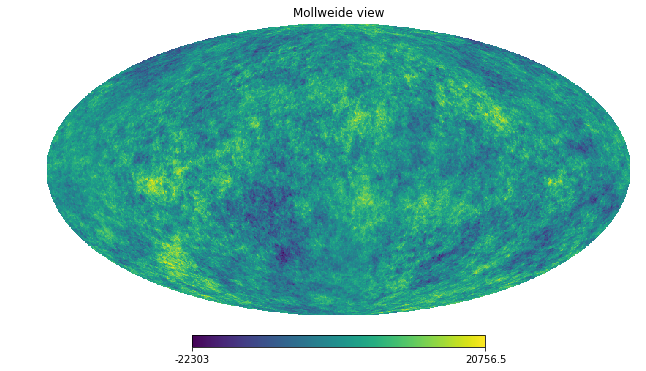

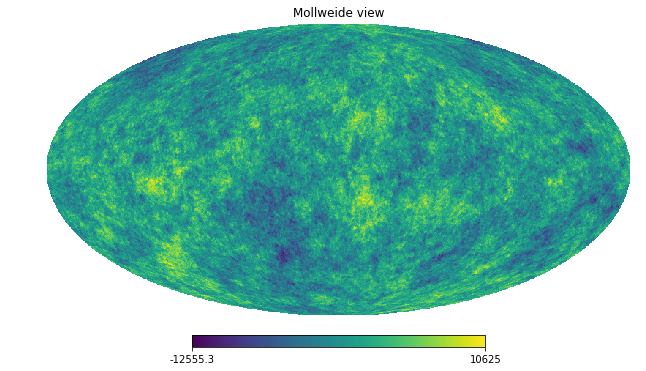

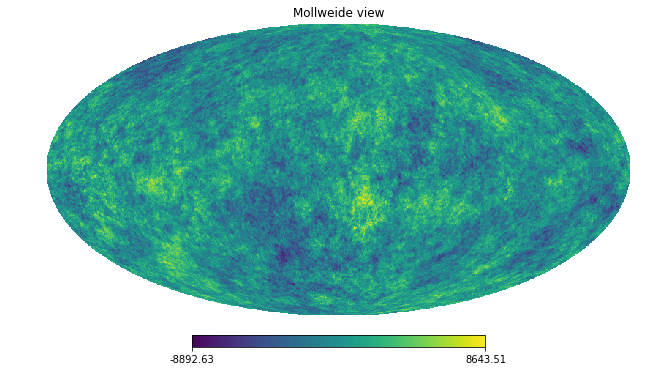

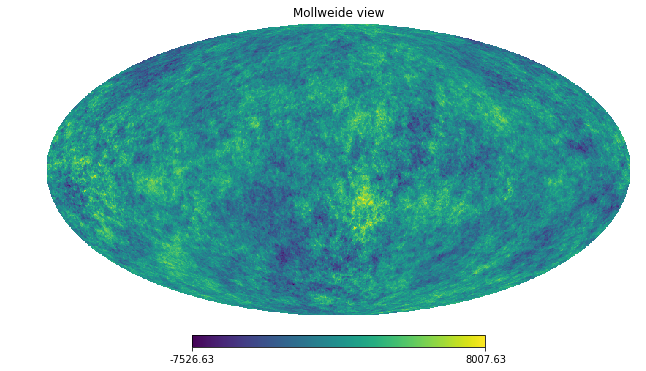

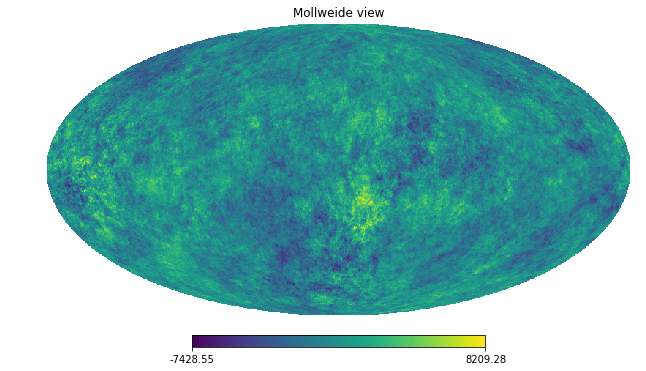

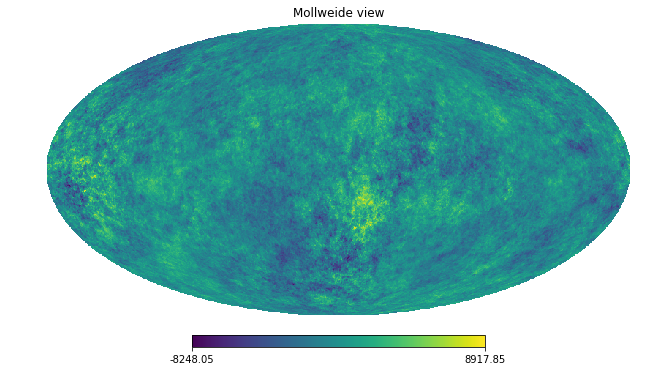

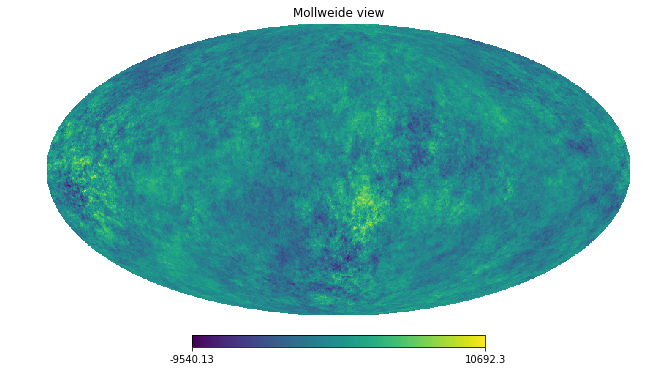

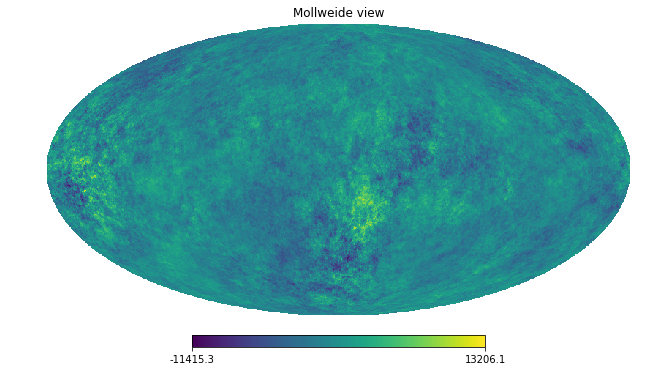

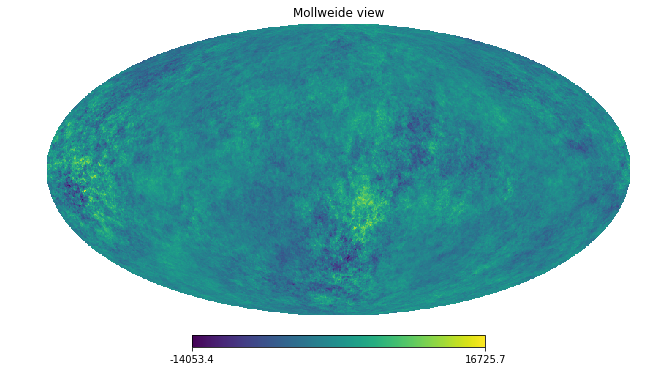

In [126]:
for i in range(len(freqs)):
    hp.mollview(full_dust[i])

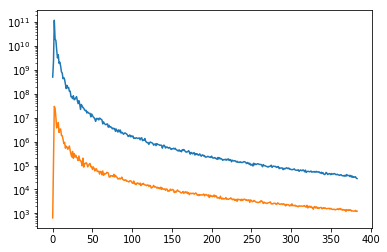

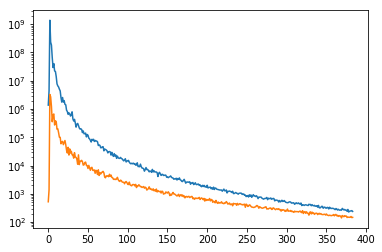

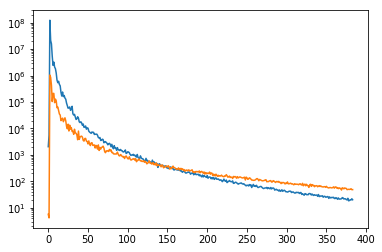

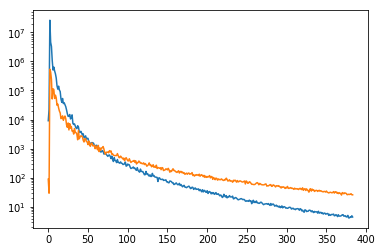

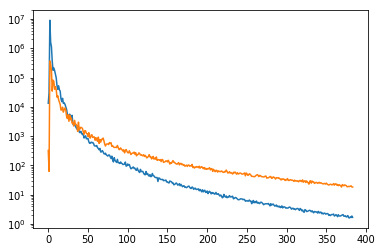

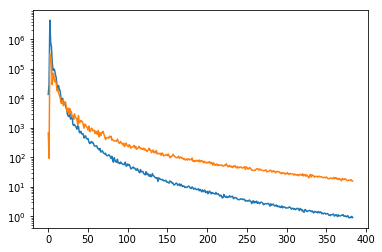

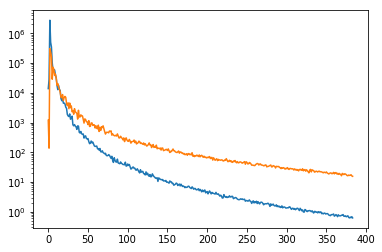

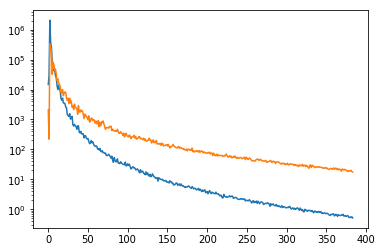

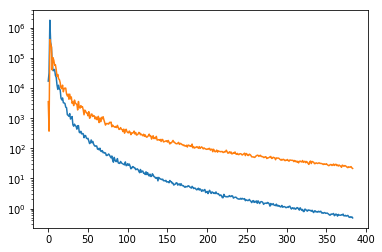

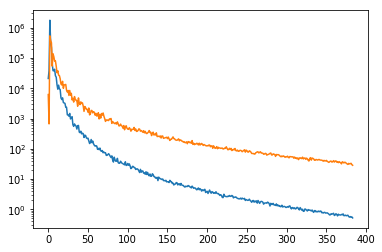

In [127]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_synch[i]))
    semilogy(hp.anafast(full_dust[i]))

In [128]:
full_fg = full_synch + full_dust

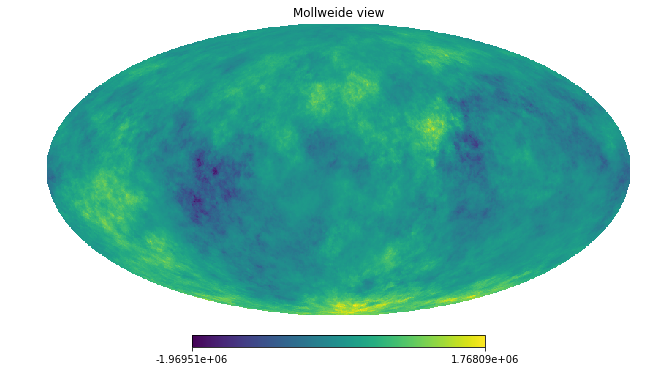

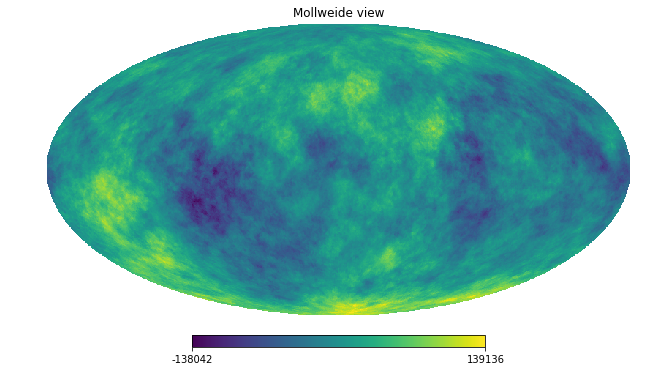

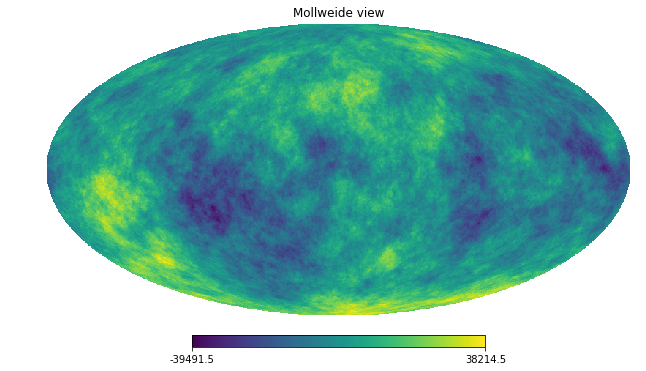

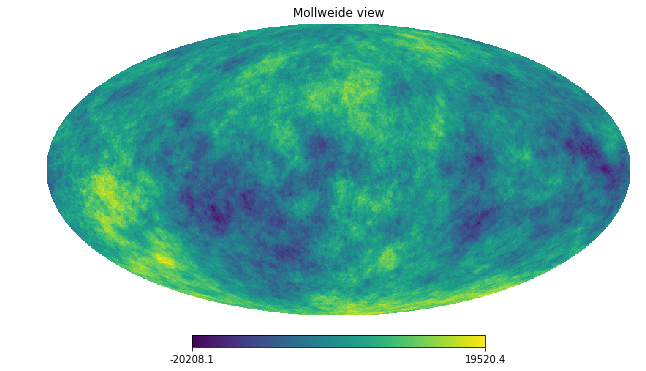

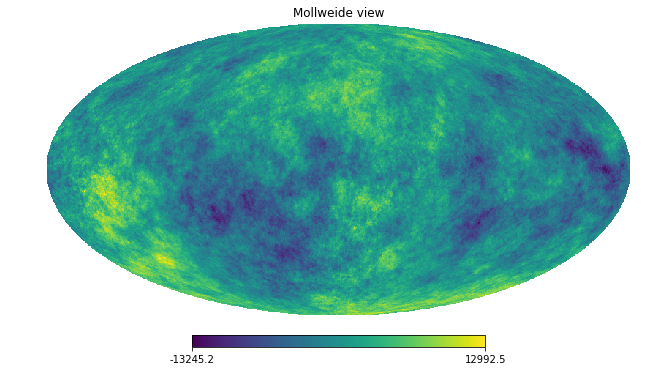

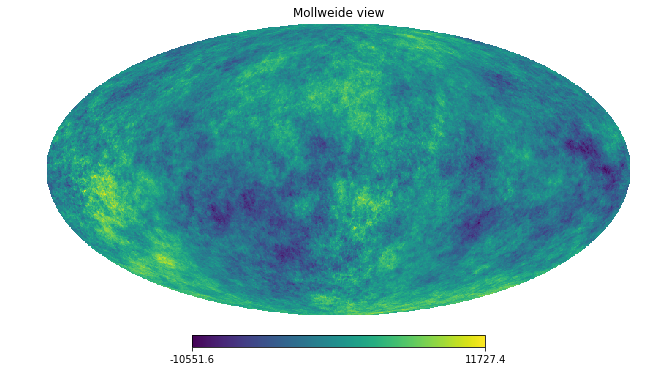

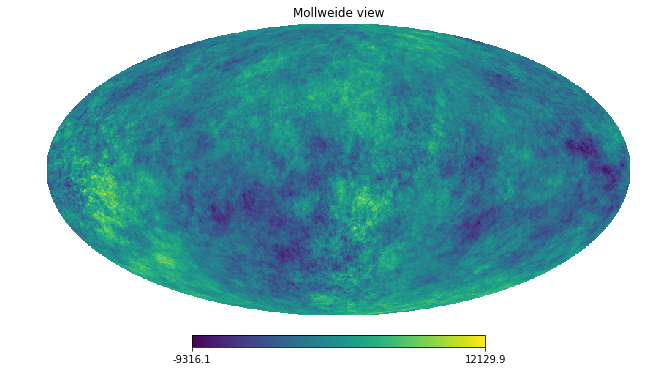

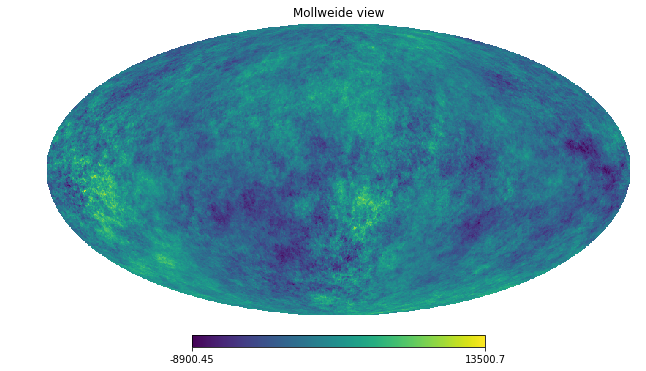

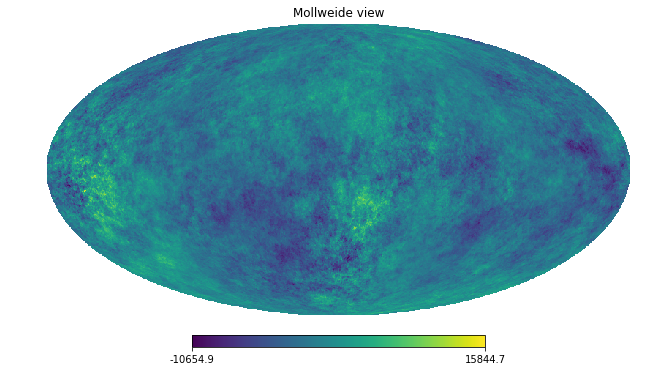

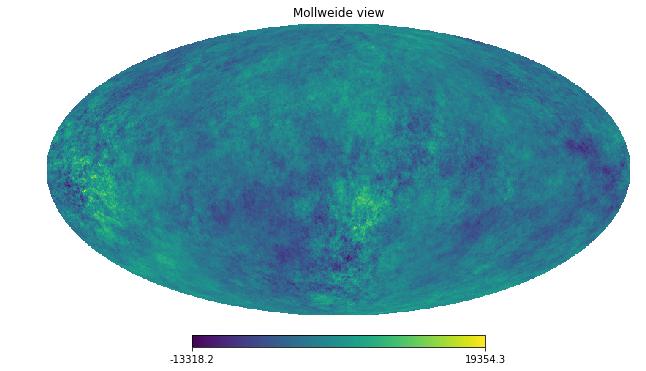

In [129]:
for i in range(len(freqs)):
    hp.mollview(full_fg[i])

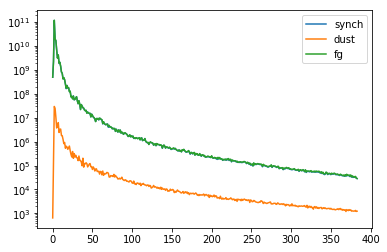

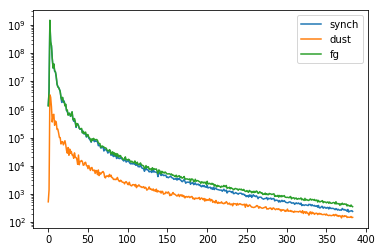

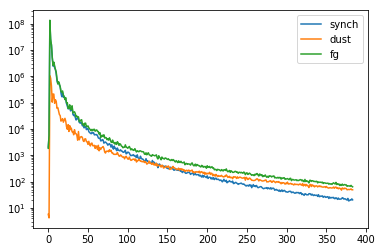

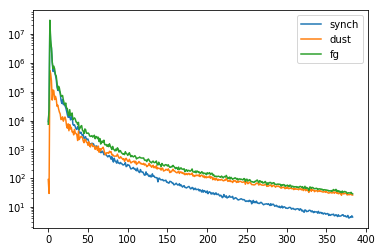

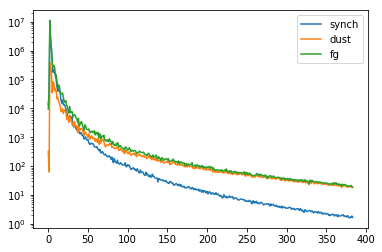

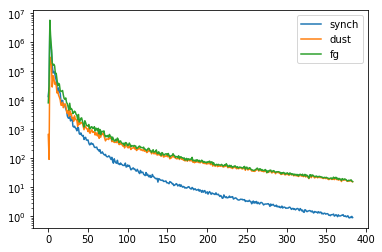

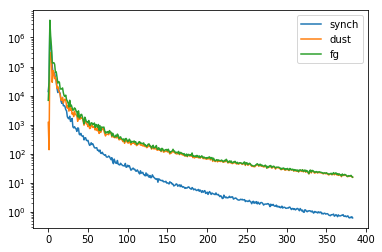

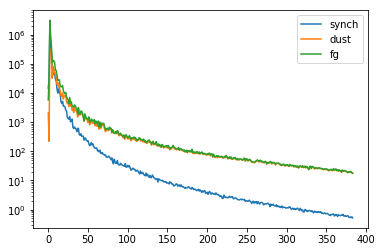

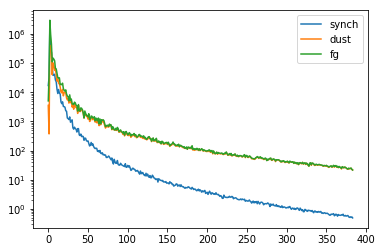

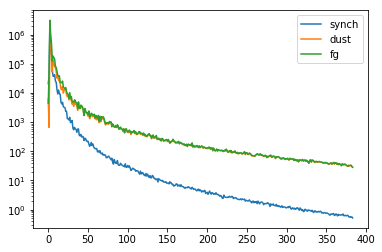

In [185]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_synch[i]), label='synch')
    semilogy(hp.anafast(full_dust[i]), label='dust')
    semilogy(hp.anafast(full_fg[i]), label='fg')
    legend()

In [144]:
model_s = ff.model_synch(ells, freqs, params_s)
model_d = ff.model_dust(ells, freqs, params_d)
model_fg = ff.model_fg(ells, freqs, params)

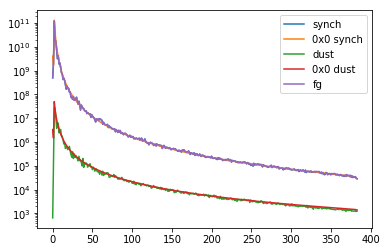

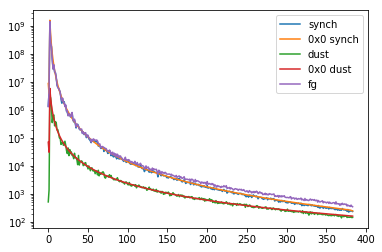

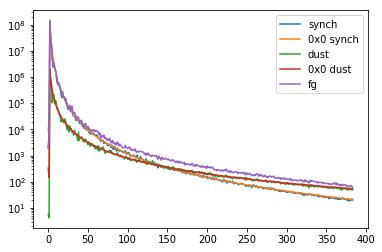

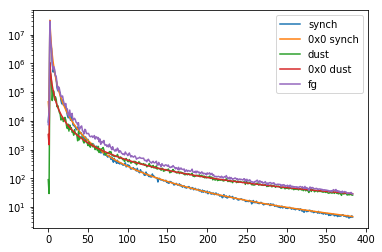

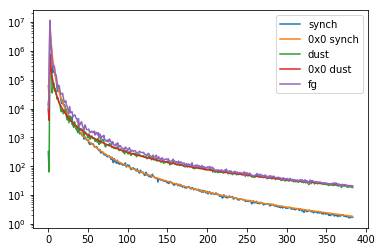

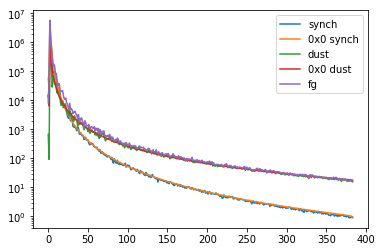

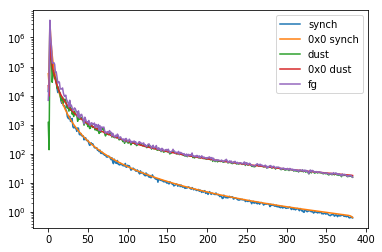

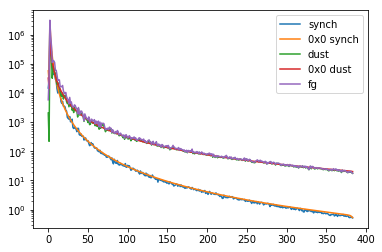

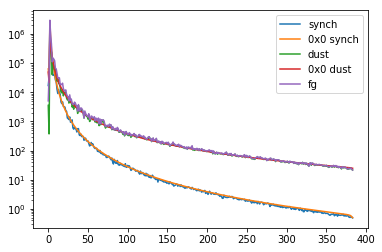

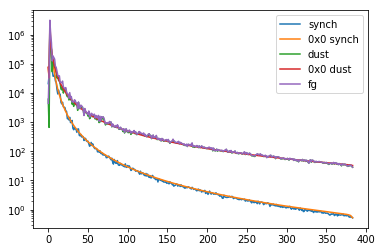

In [145]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_synch[i]), label='synch')
    semilogy(model_s[i], label='0x0 synch')
    semilogy(hp.anafast(full_dust[i]), label='dust')
    semilogy(model_d[i], label='0x0 dust')
    semilogy(hp.anafast(full_fg[i]), label='fg')
    legend()

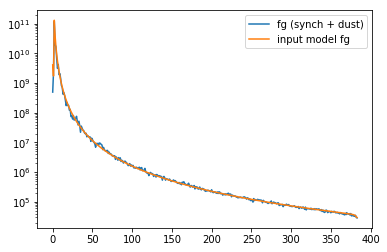

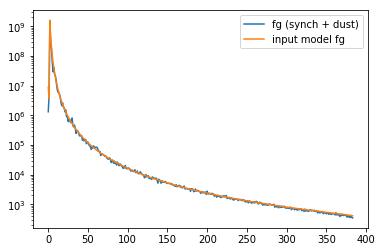

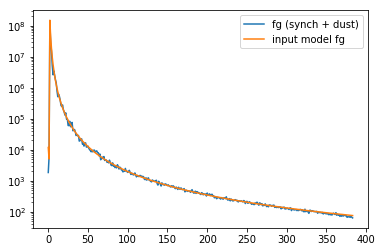

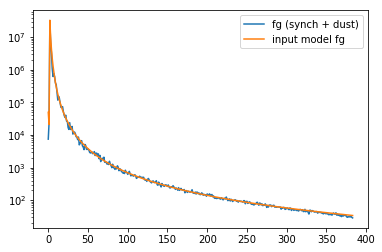

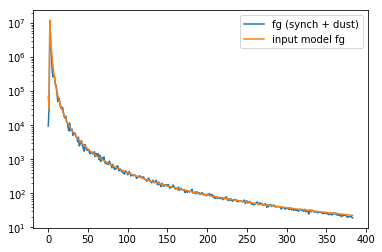

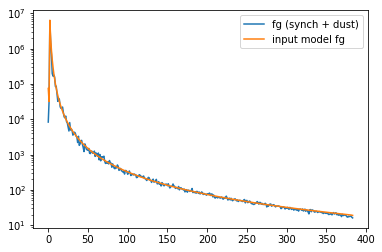

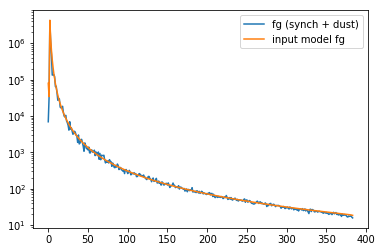

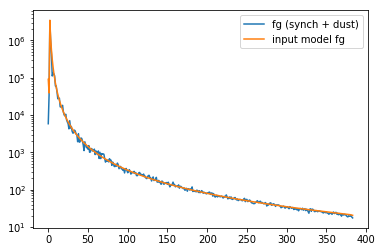

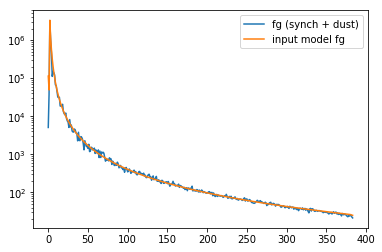

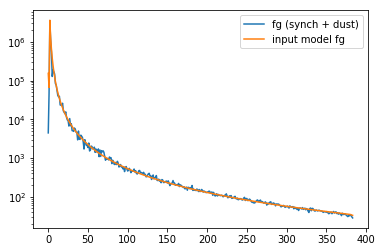

In [187]:
for i in range(len(freqs)):
    figure()
    semilogy(hp.anafast(full_fg[i]), label='fg (synch + dust)')
    semilogy(model_fg[i], label='input model fg')
    legend()

In [134]:
%autoreload

In [99]:
bb = ff.scale_dust(freqs, beta_d)

In [100]:
bb.shape

(10,)

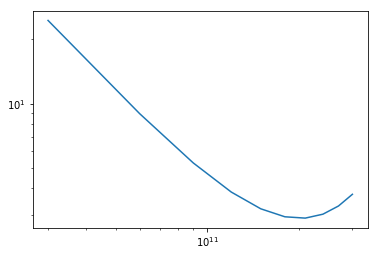

In [103]:
loglog(freqs, bb)

In [121]:
%autoreload

In [82]:
synch_sed = ff.scale_synch(freqs, beta_s)

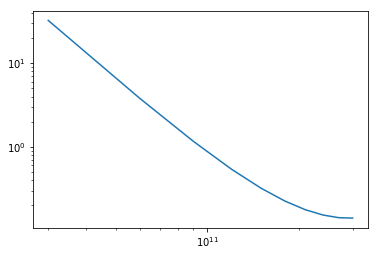

In [85]:
loglog(freqs, synch_sed)

In [90]:
dust_sed = ff.scale_dust(freqs, beta_d)

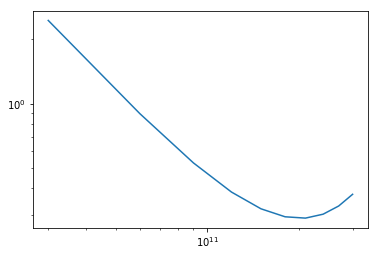

In [94]:
loglog(freqs, dust_sed)

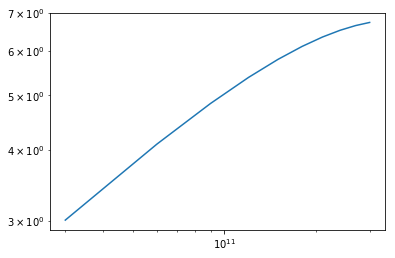

In [95]:
unscaled_dust = ff.normed_dust(freqs, beta_d)
loglog(freqs, unscaled_dust)

In [153]:
%autoreload

In [154]:
data = ff.ps_data_fg(ells, freqs, params)

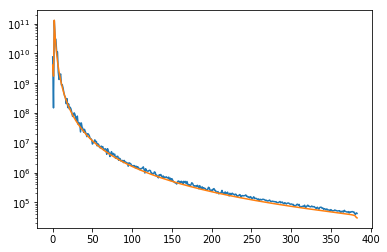

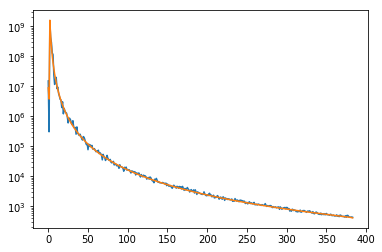

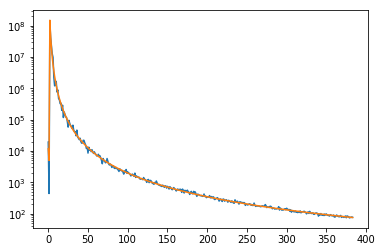

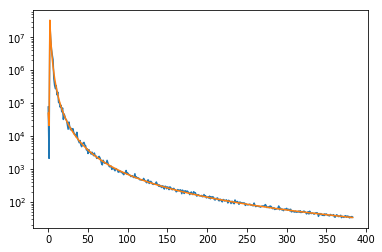

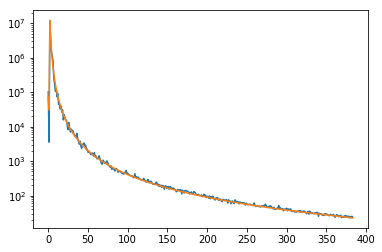

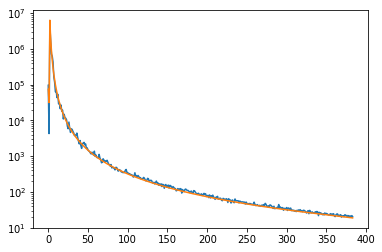

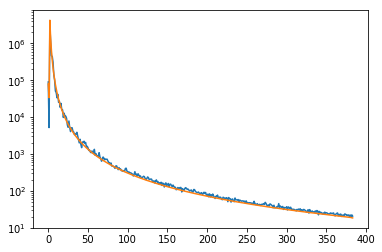

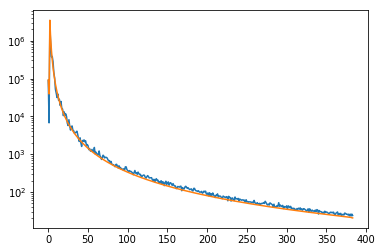

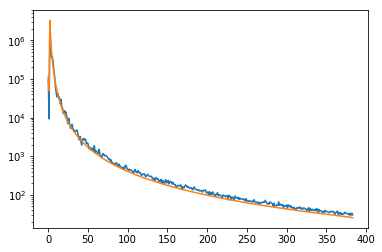

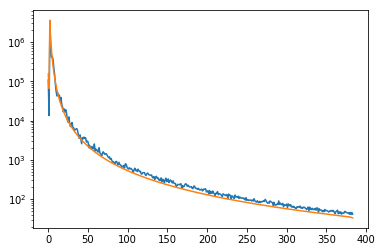

In [157]:
for i in range(len(freqs)):
    figure()
    semilogy(data[i])
    semilogy(model_fg[i])

In [147]:
%timeit ff.model_fg(ells, freqs, params)

80.1 ms ± 1.32 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [161]:
initial = [1.e3,-1.,-1.,-3.,1.e3,-1.,-1.,-3.]

In [162]:
start=time.time()
result0 = minimize(ff.chi2_fg, initial, args=(ells, freqs, data), method='L-BFGS-B', 
                   bounds=((None, None), (None, None), (None, None), (None, -2.01),
                           (None, None), (None, None), (None, None), (None, -2.01)))
print(time.time()-start)
print(result0)

150.77164578437805
      fun: 5667.077668134778
 hess_inv: <8x8 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 0.63300831, -0.00272848, -0.06330083,  0.37316568, -0.55788405,
       -0.1537046 ,  0.00836735,  0.        ])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 1737
      nit: 150
   status: 0
  success: True
        x: array([ 2.13536550e+03, -2.78237751e+00, -2.79846160e+00, -2.02500716e+00,
        2.28894069e+03, -1.85140097e+00, -1.18211417e+00, -3.15454246e+01])


In [170]:
x0 = result0.x
print(x0)
print(params)
print((x0-params)/x0*100)

[ 2.13536550e+03 -2.78237751e+00 -2.79846160e+00 -2.02500716e+00
  2.28894069e+03 -1.85140097e+00 -1.18211417e+00 -3.15454246e+01]
[1700.0, -3.0, -3.2, -2.5, 4500.0, -2.0, -1.5, -3.5]
[ 20.38833617  -7.82145814 -14.34854084 -23.45635377 -96.5974928
  -8.02630174 -26.89129635  88.90488859]


In [164]:
fit0 = ff.model_fg(ells, freqs, x0)

In [172]:
print(ff.chi2_fg(params,ells, freqs, data))
print(ff.chi2_fg(x0, ells, freqs, data))

10592.118930996581
5667.077668134778


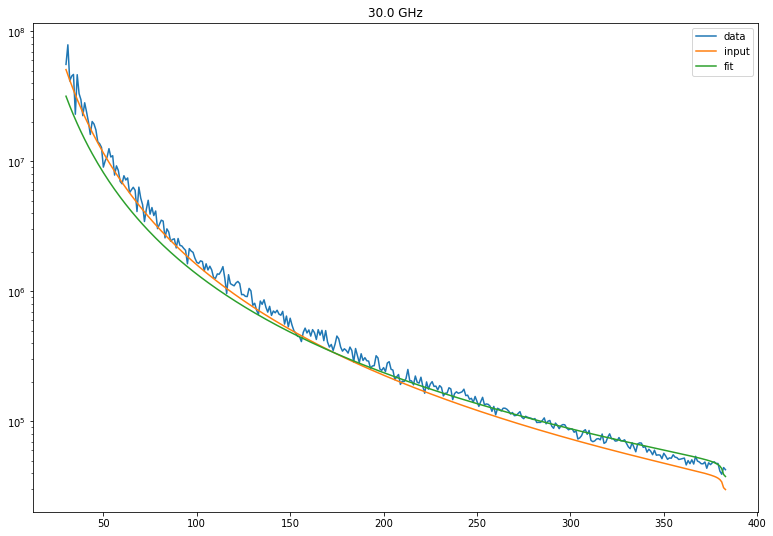

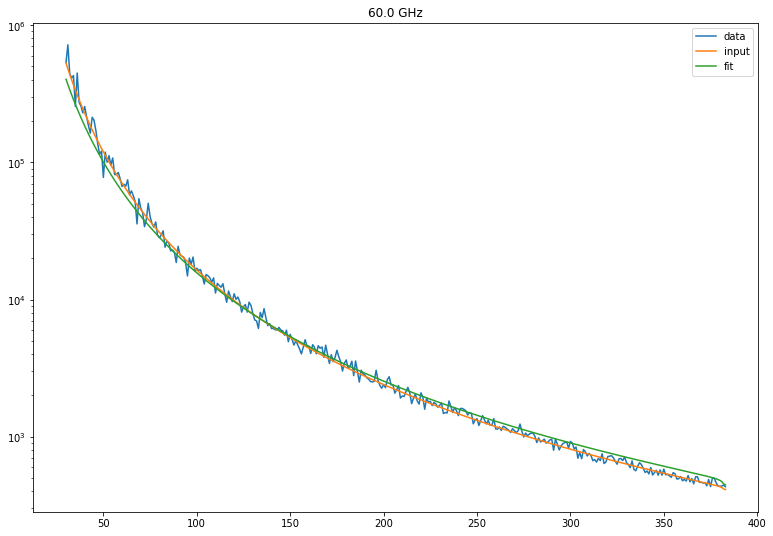

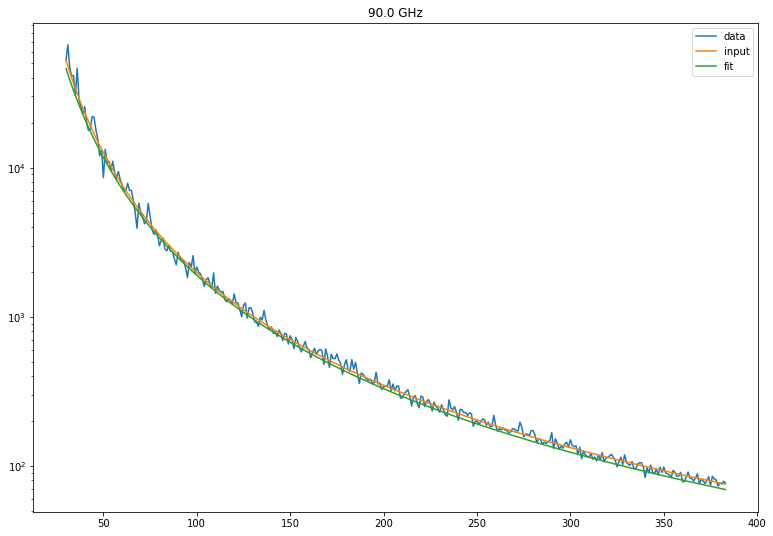

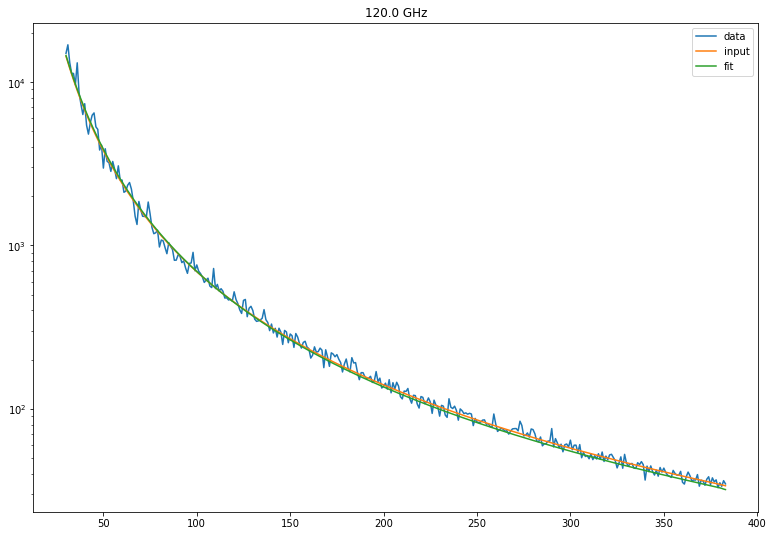

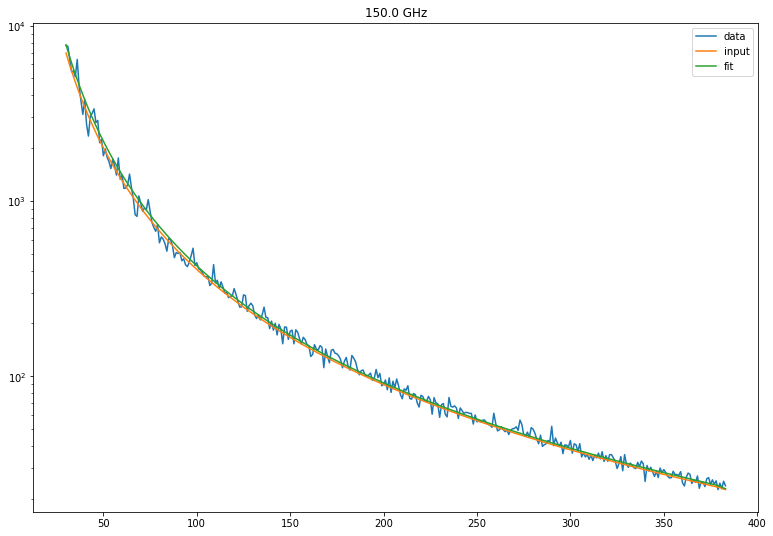

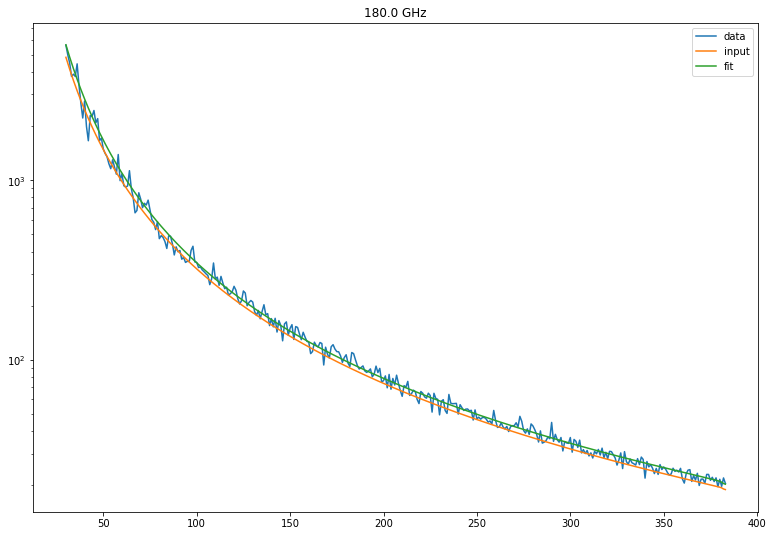

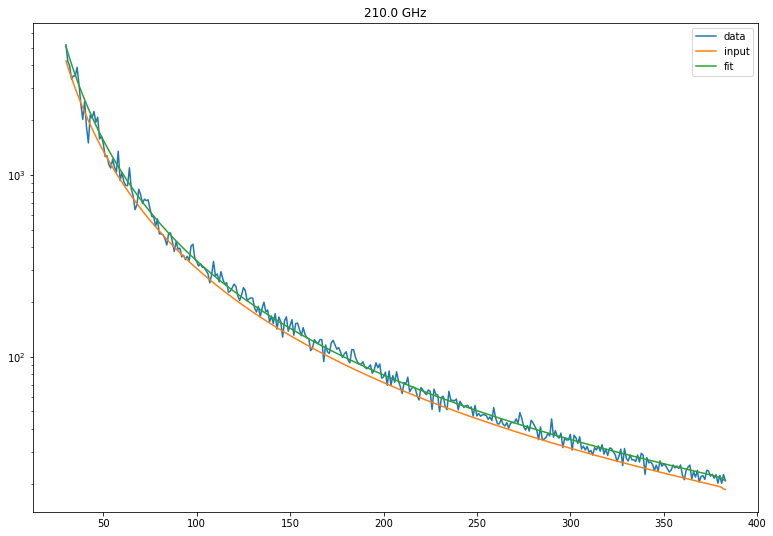

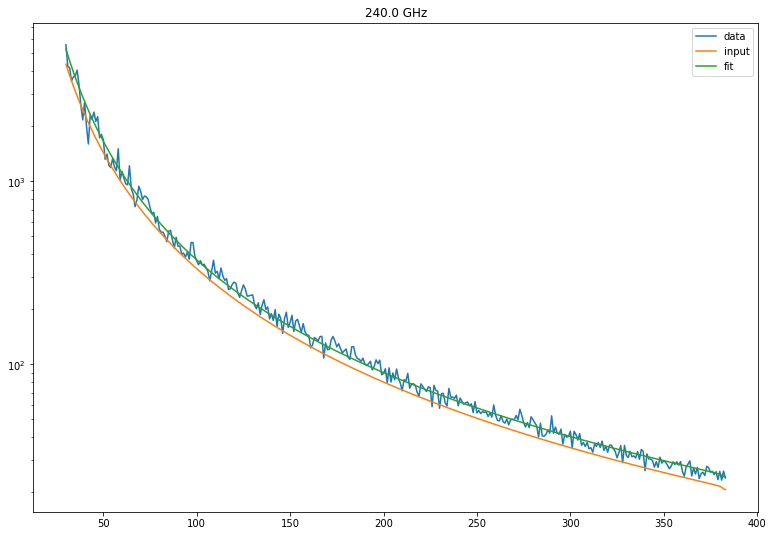

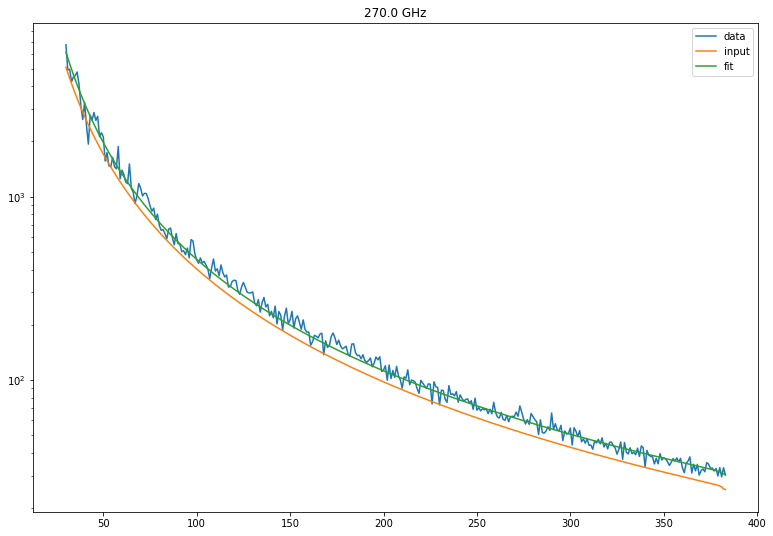

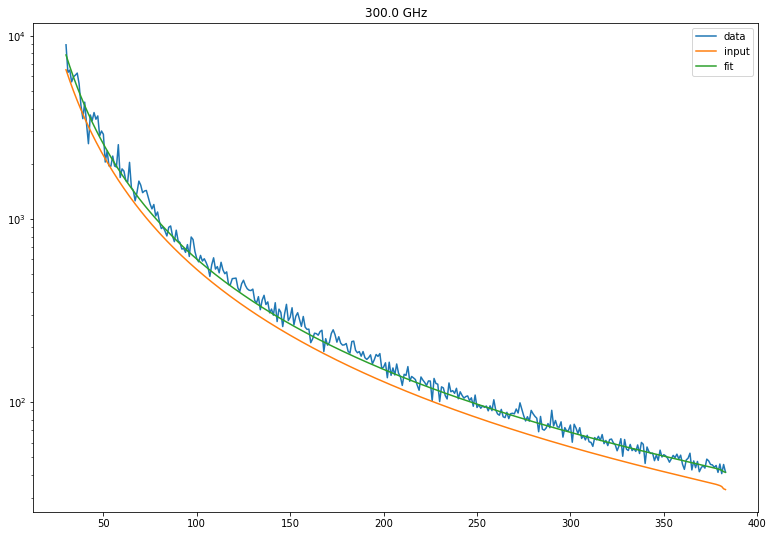

In [169]:
for i in range(len(freqs)):
    figure(figsize=(13,9))
    semilogy(ells[30:], data[i][30:], label='data')
    semilogy(ells[30:], model_fg[i][30:], label='input')
    semilogy(ells[30:], fit0[i][30:], label='fit')
    title(str(np.round(1e-9*freqs[i])) + ' GHz')
    legend()

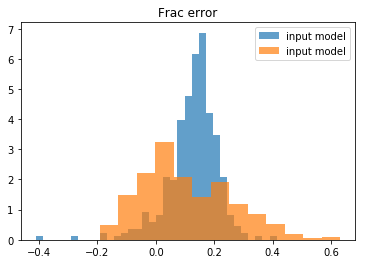

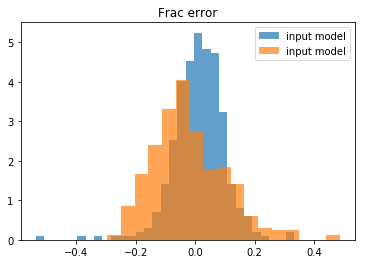

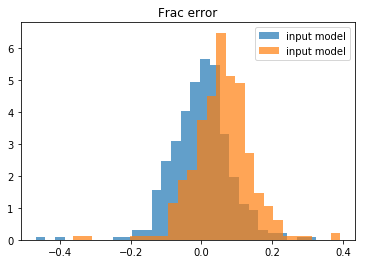

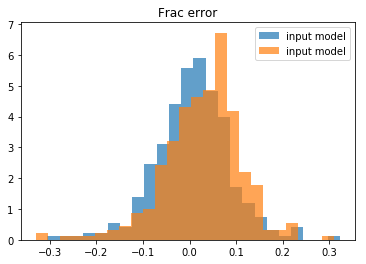

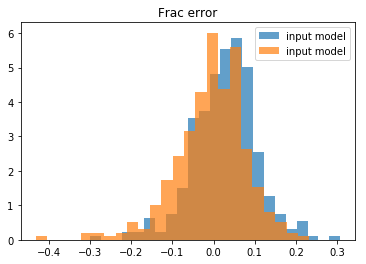

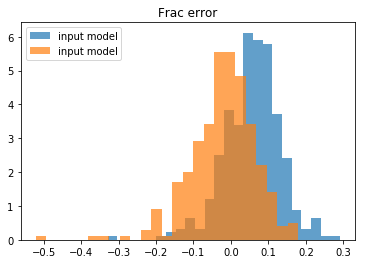

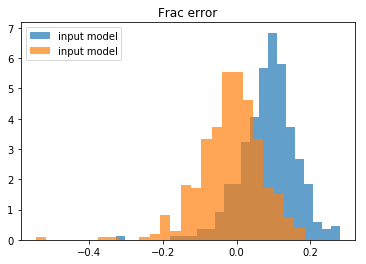

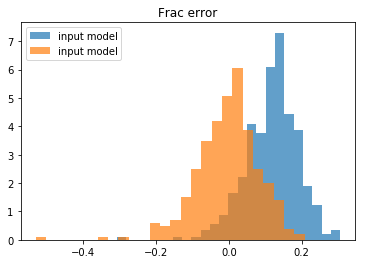

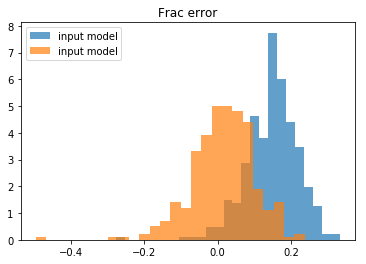

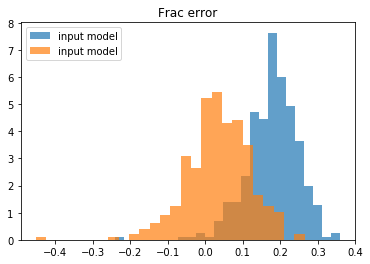

In [176]:
for i in range(len(freqs)):
    figure()
    hist((data[i][30:]-model_fg[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='input model')
    hist((data[i][30:]-fit0[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='input model')
    title('Frac error')
    legend()

In [178]:
initial1 = [1.e3,-1.,-1.,-3.,3.e3,-1.,-1.,-3.]
#start closer to the correct amplitudes

In [179]:
start=time.time()
result1 = minimize(ff.chi2_fg, initial1, args=(ells, freqs, data), method='L-BFGS-B', 
                   bounds=((None, None), (None, None), (None, None), (None, -2.01),
                           (None, None), (None, None), (None, None), (None, -2.01)))
print(time.time()-start)
print(result1)

92.91362690925598
      fun: 10332.82677315224
 hess_inv: <8x8 LbfgsInvHessProduct with dtype=float64>
      jac: array([-8.36662366e+00,  1.10122062e+04,  5.12366896e+03, -2.07523235e+05,
       -1.95232133e+00,  5.73700781e+03, -1.14533523e+03, -8.68531060e+00])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 1143
      nit: 87
   status: 0
  success: True
        x: array([ 1.10544527e+03, -2.35428097e+00, -2.86615721e+00, -2.01071677e+00,
        3.05845389e+03, -1.94618421e+00, -1.31682846e+00, -3.64155422e+00])


In [180]:
x1 = result1.x
print(x1)
print(params)
print((x1-params)/x1*100)

[ 1.10544527e+03 -2.35428097e+00 -2.86615721e+00 -2.01071677e+00
  3.05845389e+03 -1.94618421e+00 -1.31682846e+00 -3.64155422e+00]
[1700.0, -3.0, -3.2, -2.5, 4500.0, -2.0, -1.5, -3.5]
[-53.78418442 -27.42744111 -11.64774867 -24.33377155 -47.13316465
  -2.76519512 -13.91005345   3.88719241]


In [181]:
fit1 = ff.model_fg(ells, freqs, x1)

In [182]:
print(ff.chi2_fg(params,ells, freqs, data))
print(ff.chi2_fg(x0, ells, freqs, data))
print(ff.chi2_fg(x1, ells, freqs, data))

10592.118930996581
5667.077668134778
10332.82677315224


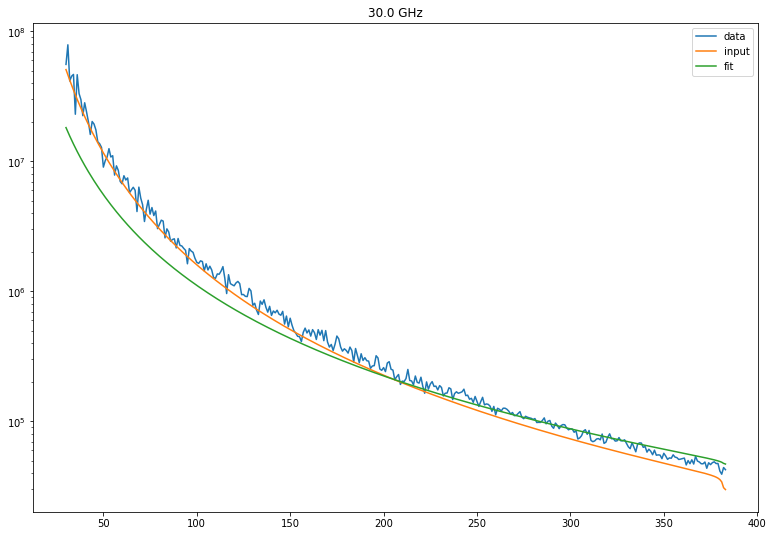

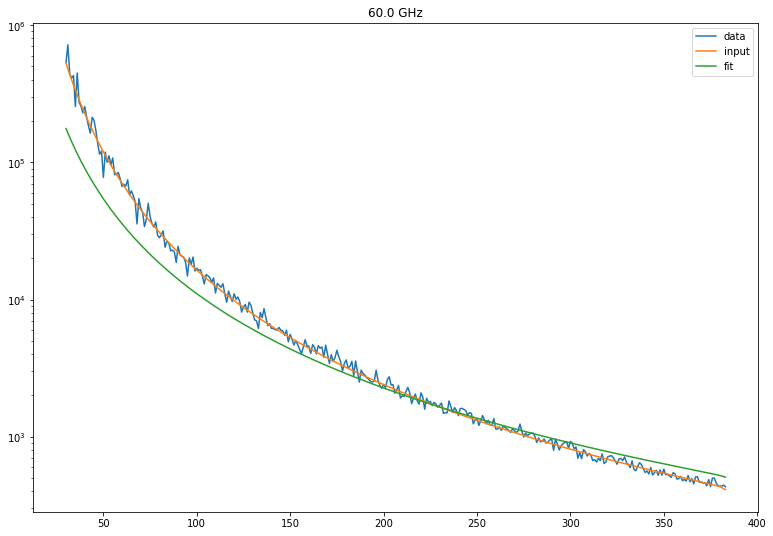

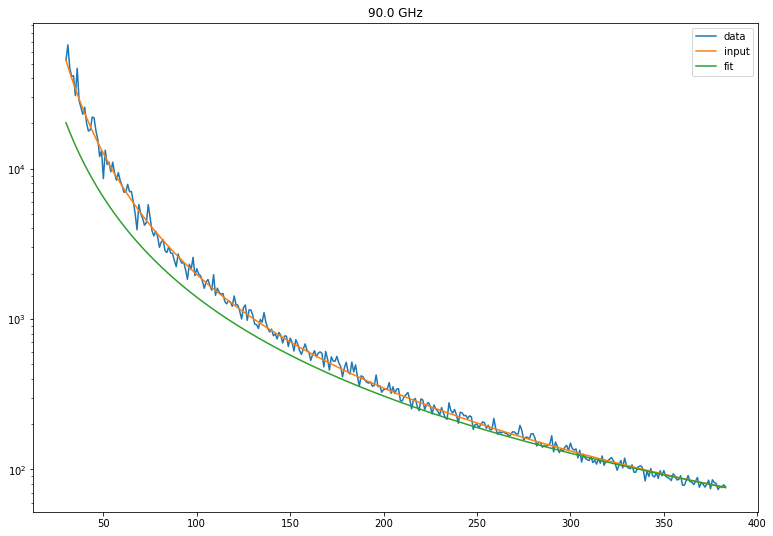

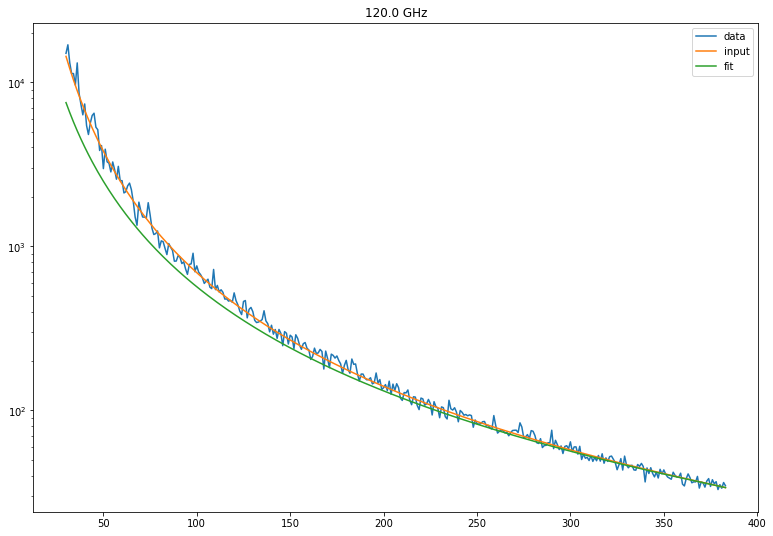

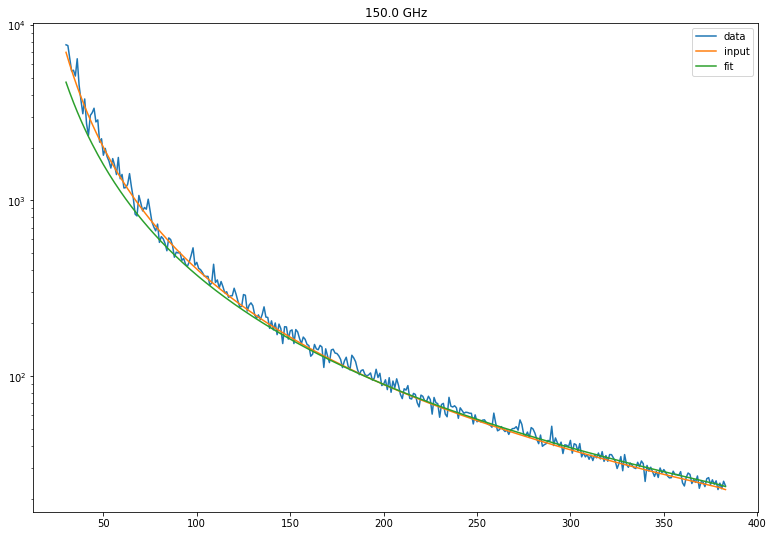

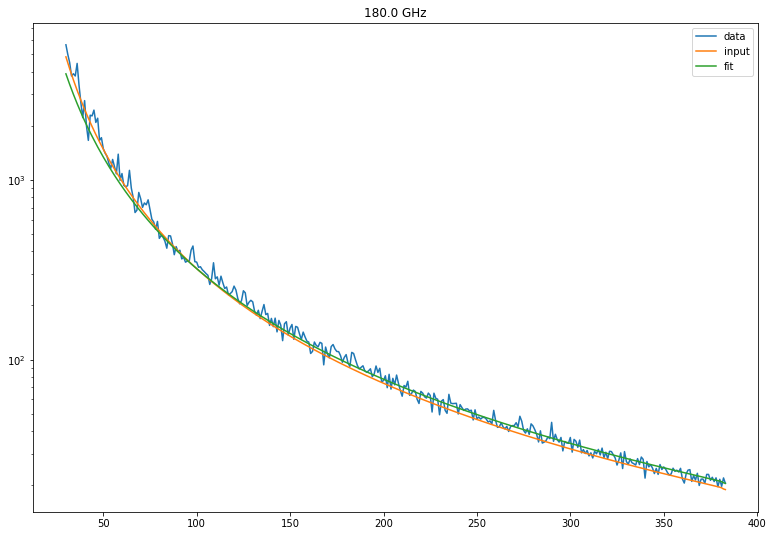

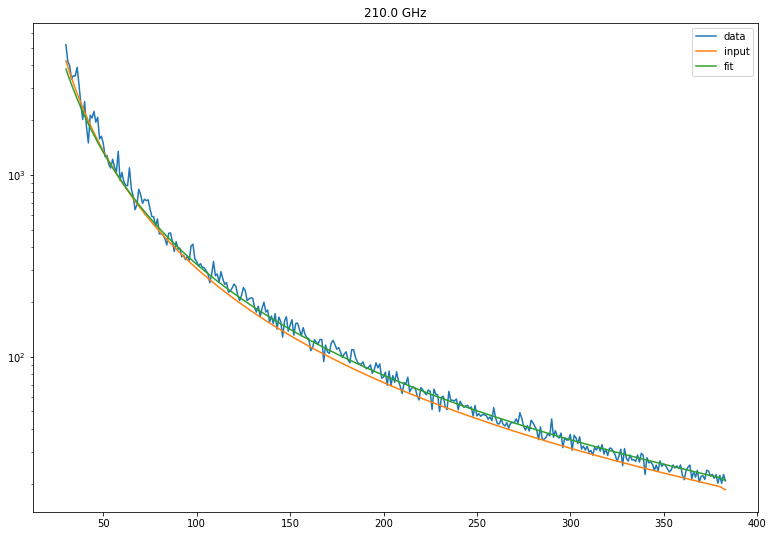

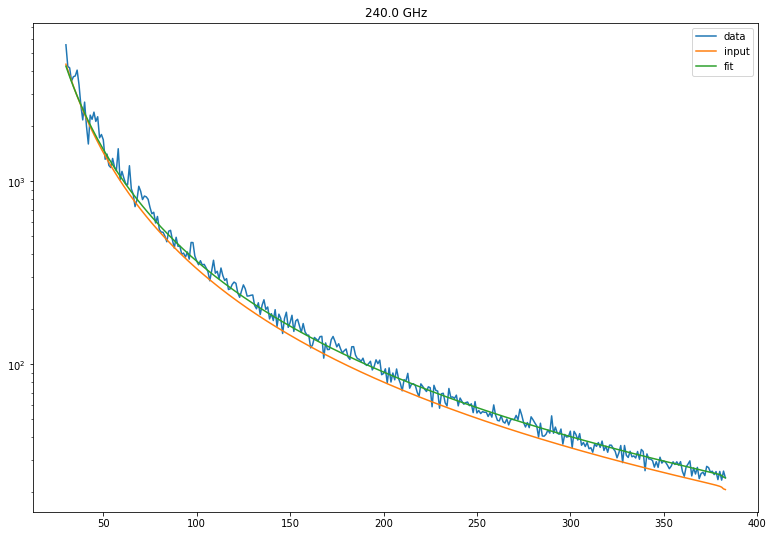

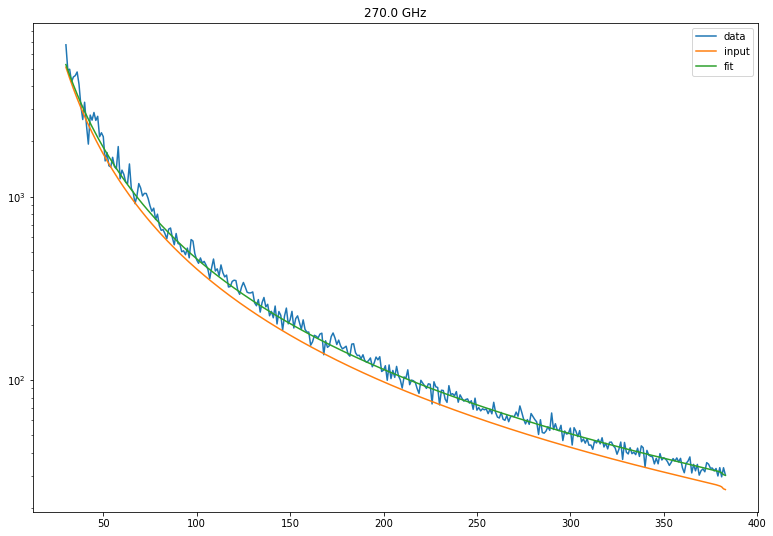

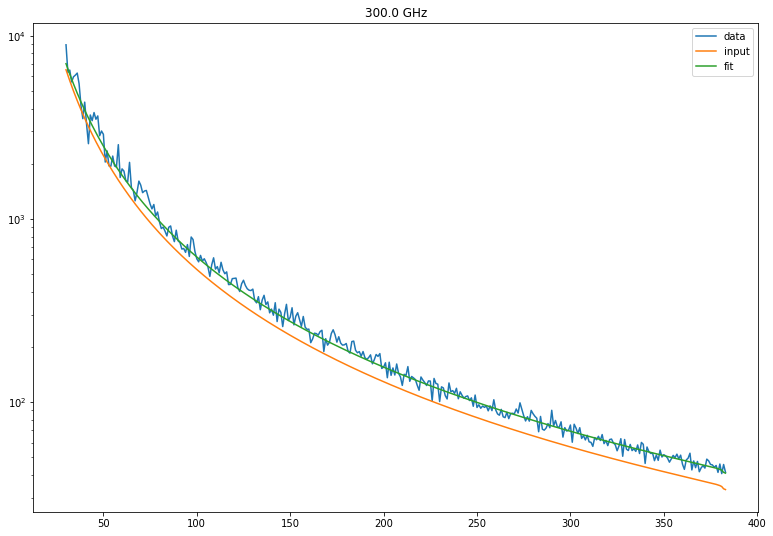

In [183]:
for i in range(len(freqs)):
    figure(figsize=(13,9))
    semilogy(ells[30:], data[i][30:], label='data')
    semilogy(ells[30:], model_fg[i][30:], label='input')
    semilogy(ells[30:], fit1[i][30:], label='fit')
    title(str(np.round(1e-9*freqs[i])) + ' GHz')
    legend()

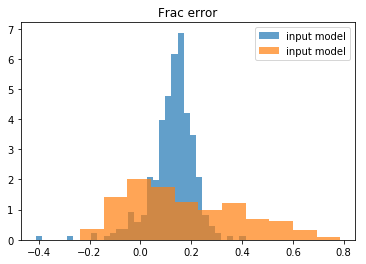

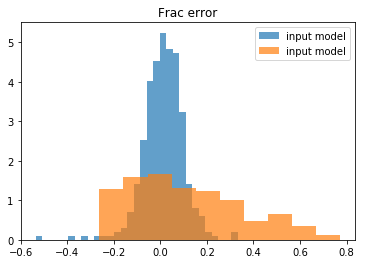

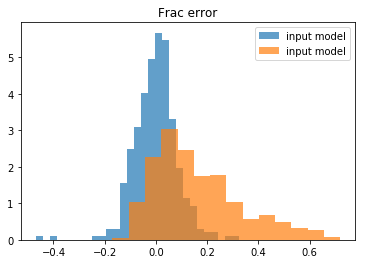

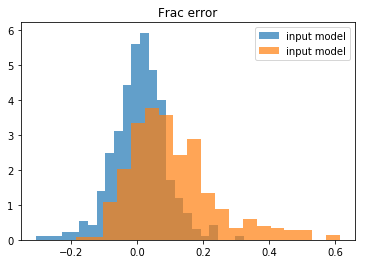

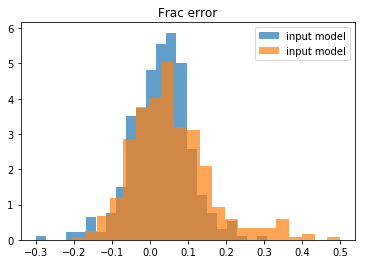

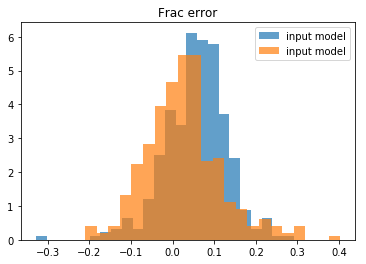

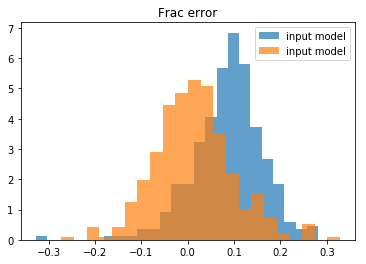

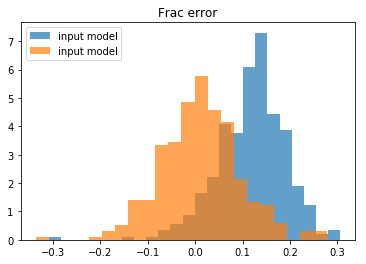

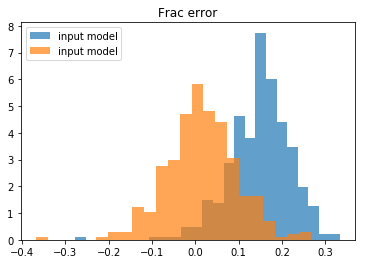

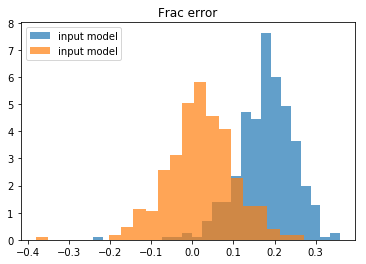

In [186]:
for i in range(len(freqs)):
    figure()
    hist((data[i][30:]-model_fg[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='input model')
    hist((data[i][30:]-fit1[i][30:])/data[i][30:], bins='auto', density=True, alpha=0.7, label='input model')
    title('Frac error')
    legend()